<a href="https://colab.research.google.com/github/banghj-kr/python/blob/Driving_Simulation/Driving_Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. 기본 설정

In [ ]:
# 01-1. 필요한 라이브러리 로딩 및 함수 정의 (240801)
print("01-1. 필요한 라이브정의 로딩 및 함수 정의")
#!pip install gspread google-auth
# 필요한 라이브러리 로딩
import pandas as pd
import numpy as np
import math
import os
from datetime import datetime
import traceback
import pytz
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager as fm
import matplotlib.ticker as ticker
from IPython import get_ipython

def check_environment():
    try:
        if 'google.colab' in env:  # Colab 환경
            from google.colab import data_table
            from google.auth.transport.requests import Request
            from google.oauth2.service_account import Credentials
            from google.colab import drive

            # 구글 드라이브 마운트 - Colab 환경 only
            drive.mount('/content/drive')

            # 데이터프레임을 구글 코랩의 데이터 테이블로 출력 활성화 - Colab 환경 only
            data_table.enable_dataframe_formatter()

            # 기본 경로 설정
            base_path = '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/'
            return base_path

        elif 'ZMQInteractiveShell' in env:  # Jupyter 환경
            # 기본 경로 설정
            base_path = ''
            return base_path
        else:
            return None
    except ImportError:
        return None

# 서울 시간대 설정
tz = pytz.timezone('Asia/Seoul')

# 환경에 맞는 기본 경로 설정
env = str(get_ipython())  # 실행 환경 확인
base_path = check_environment()
print(f"  - 기본 경로를 '{base_path}'로 설정하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# pandas display 옵션 설정
pd.set_option('display.max_columns', 12)
pd.set_option('display.max_rows', 100)

# 필요한 함수 정의

# 데이터프레임을 CSV 파일로 저장하는 함수 정의
def save_to_csv(df, output_file_path):
    df.to_csv(output_file_path, encoding='utf-8-sig', index=False)
    print(f"  * '{output_file_path}' 파일에 데이터를 저장하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# 데이터프레임을 Parquet 파일로 저장하는 함수 정의
def save_to_parquet(df, output_file_path):
    df.to_parquet(output_file_path, index=False)
    print(f"  * '{output_file_path}' 파일에 데이터를 저장하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# 파일 경로 및 이름 설정 함수 정의
def generate_file_path(mode, base_path, sub_dir, file_name, ext, add_timestamp=True):
    if mode == 'input':
        # 입력 파일 경로 설정 (타임스탬프 없이)
        return f'{base_path}{sub_dir}/{file_name}.{ext}'
    elif mode == 'output':
        # 출력 파일 경로 설정 (타임스탬프 추가 가능)
        output_file_path = f'{base_path}{sub_dir}/{file_name}.{ext}'
        if add_timestamp:
            date_str = datetime.now(tz).strftime("%Y%m%d.%H%M%S")
            output_file_path = f"{os.path.splitext(output_file_path)[0]}_{date_str}.{ext}"
        return output_file_path
    else:
        raise ValueError("  * 파일의 경로와 이름을 설정하는 함수의 첫 번째 매개변수는 'input' 또는 'output'으로 설정해주세요.")

print(f"  - 라이브러리 로딩 및 함수 정의를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

01-1. 필요한 라이브정의 로딩 및 함수 정의
Mounted at /content/drive
  - 기본 경로를 '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/'로 설정하였습니다. (2024-08-03 19:49:54)
  - 라이브러리 로딩 및 함수 정의를 완료하였습니다. (2024-08-03 19:49:54)


In [ ]:
# 01-2. 글꼴(Times New Roman) 설정 (240801)
print("01-2. 글꼴(Times New Roman) 설정")

def set_font(env):
    if 'google.colab' in env:
        # 폰트 파일을 시스템 폰트 디렉토리로 복사
        !cp /content/drive/MyDrive/Colab\ Notebooks/Fonts/Times_New_Roman/*.ttf /usr/share/fonts/truetype/

        # 폰트 디렉토리 확인
        print(f"  - 설치된 폰트 목록 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
        !ls /usr/share/fonts/truetype/

        # 폰트 캐시 재빌드
        fm._load_fontmanager(try_read_cache=False)

        # Times New Roman 폰트 경로 설정
        font_path_regular = '/usr/share/fonts/truetype/times.ttf'
        font_path_bold = '/usr/share/fonts/truetype/timesbd.ttf'

        print(f"  - Google Colab 환경에서 Times New Roman 폰트를 사용합니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    elif 'ZMQInteractiveShell' in env:
        # Times New Roman 폰트 경로 설정
        font_path_regular = 'C:\\Windows\\Fonts\\times.ttf'
        font_path_bold = 'C:\\Windows\\Fonts\\timesbd.ttf'

        print(f"  - Jupyter 환경에서 Times New Roman 폰트를 사용합니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    # 설치된 폰트 목록 확인
    font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')

    # 폰트 목록 출력
    print(f"\n  - 설치된 폰트 위치 목록 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
    for font in font_list:
        print(font)

    # Times New Roman 폰트를 설정
    times_font = fm.FontProperties(fname=font_path_regular)
    times_bold_font = fm.FontProperties(fname=font_path_bold)

    # Times New Roman을 기본 폰트로 설정
    plt.rcParams['font.family'] = times_font.get_name()
    print(f"\n  - Times New Roman을 기본 폰트로 설정하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

    return times_font, times_bold_font

# 환경에 따라 폰트 설정
times_font, times_bold_font = set_font(env)

# ==================================================

01-2. 글꼴(Times New Roman) 설정
  - 설치된 폰트 목록 (2024-08-03 19:49:57)
humor-sans  liberation	timesbd.ttf  timesbi.ttf  timesi.ttf  times.ttf
  - Google Colab 환경에서 Times New Roman 폰트를 사용합니다. (2024-08-03 19:49:57)

  - 설치된 폰트 위치 목록 (2024-08-03 19:49:57)
/usr/share/fonts/truetype/liberation/LiberationSans-Italic.ttf
/usr/share/fonts/truetype/liberation/LiberationSerif-Italic.ttf
/usr/share/fonts/truetype/timesbi.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf
/usr/share/fonts/truetype/liberation/LiberationSerif-BoldItalic.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-BoldItalic.ttf
/usr/share/fonts/truetype/timesi.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Bold.ttf
/usr/share/fonts/truetype/timesbd.ttf
/usr/share/fonts/truetype/liberation/LiberationSerif-Regular.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-Regular.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf
/usr/share/fonts/truetype/humor-sans/Humor-Sa

# 2. 데이터 입력 및 전처리

In [ ]:
# 02-1. Travel Speed 데이터 입력 및 설정 (240803)
print("02-1. Travel Speed 데이터 입력 및 설정")

# Travel Speed 데이터를 처리하는 함수 정의
def process_travel_speed(input_file_path, direction):
    # CSV 파일을 읽어 데이터프레임으로 변환
    df = pd.read_csv(input_file_path)
    print(f"    - '{input_file_path}' 파일을 읽었습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")

    # 데이터 및 데이터프레임 구조 확인
    print(f"    - 읽어온 데이터 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
    print(f"      * {direction.capitalize()} Travel Speed:")
    display(df)
    print(f"\n      * {direction.capitalize()} Travel Speed DataFrame Information:")
    display(df.info())

    # 1. 주행 거리를 5m 단위로 세분화하고 선형보간
    min_distance = df['travel_distance'].min()
    max_distance = df['travel_distance'].max()
    all_distances_5m = pd.Series(range(min_distance, max_distance + 5, 5))
    df = df.set_index('travel_distance').reindex(all_distances_5m).interpolate().reset_index().rename(columns={'index': 'travel_distance'})
    print(f"\n    - 주행 거리를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
    travel_speed_table = df[['travel_distance'] + [f'travel_speed_{i}' for i in range(1, 12)]]
    display(travel_speed_table.head())

    # 2. 지점별 개별 주행 속도(1~11번)의 평균 계산 (12번에 저장)
    speed_columns_original = [f'travel_speed_{i}' for i in range(1, 12)]
    df['travel_speed_12'] = df[speed_columns_original].mean(axis=1)
    print(f"\n    - 개별 주행 속도의 평균값을 계산하여 새로운 열 'travel_speed_12'에 저장하였습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
    travel_speed_table = df[['travel_distance'] + [f'travel_speed_{i}' for i in range(1, 13)]]
    display(travel_speed_table.head())

    # 3. 지점별 개별 소요 시간(min), 누적 소요 시간(min), 가속도(m/s²)와 각각의 평균 계산 (주행 속도 이용)
    speed_columns = [f'travel_speed_{i}' for i in range(1, 13)]
    additional_cols = {}
    for col in speed_columns:
        additional_cols[f'{col}_prev_travel_distance'] = df['travel_distance'].shift(1)  # 이전 행 주행 거리 (m)
        additional_cols[f'{col}_prev_speed'] = df[col].shift(1)  # 이전 행 주행 속도 (kph)
        additional_cols[f'{col}_distance_diff'] = df['travel_distance'] - additional_cols[f'{col}_prev_travel_distance']  # 거리 차이 (m)
        additional_cols[f'{col}_average_speed'] = (df[col] + additional_cols[f'{col}_prev_speed']) / 2  # 평균 속도 (kph)
        additional_cols[f'{col}_time_diff_min'] = (additional_cols[f'{col}_distance_diff'] / 1000) / additional_cols[f'{col}_average_speed'] * 60  # 소요 시간 (min)
        additional_cols[f'{col}_time_diff_min'].fillna(0, inplace=True)  # 소요 시간이 NaN인 경우 0으로 설정
        additional_cols[f'{col}_cumulative_time_min'] = additional_cols[f'{col}_time_diff_min'].cumsum()  # 누적 소요 시간 (min)

        # 가속도 계산
        # km/h -> m/s 변환: 1 km/h = 1000/3600 m/s = 5/18 m/s
        speed_m_per_s = df[col] * (5/18)
        prev_speed_m_per_s = additional_cols[f'{col}_prev_speed'] * (5/18)
        time_diff_s = additional_cols[f'{col}_time_diff_min'] * 60
        additional_cols[f'{col}_acceleration'] = (speed_m_per_s - prev_speed_m_per_s) / time_diff_s
        additional_cols[f'{col}_acceleration'].fillna(0, inplace=True)  # 가속도가 NaN인 경우 0으로 설정

    # 추가 열을 데이터프레임에 병합
    additional_df = pd.DataFrame(additional_cols)
    df = pd.concat([df, additional_df], axis=1)
    print(f"\n    - 지점별 소요 시간(min), 누적 소요 시간(min), 가속도(m/s²)를 계산하여 데이터프레임에 추가하였습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")

    # 소요 시간 테이블
    time_diff_table = df[['travel_distance'] + [f'travel_speed_{i}_time_diff_min' for i in range(1, 13)]]
    print("      - 소요 시간:")
    display(time_diff_table.head())

    # 누적 소요 시간 테이블
    cumulative_time_table = df[['travel_distance'] + [f'travel_speed_{i}_cumulative_time_min' for i in range(1, 13)]]
    print("\n      - 누적 소요 시간:")
    display(cumulative_time_table.head())

    # 가속도 테이블
    acceleration_table = df[['travel_distance'] + [f'travel_speed_{i}_acceleration' for i in range(1, 13)]]
    print("\n      - 가속도:")
    display(acceleration_table.head())

    # 4. 모든 변수의 개별 데이터 삭제
    df['travel_speed_kph'] = df['travel_speed_12']
    df['acceleration_ms2'] = df['travel_speed_12_acceleration']
    df['time_diff_min'] = df['travel_speed_12_time_diff_min']
    df['cumulative_time_min'] = df['travel_speed_12_time_diff_min'].cumsum()

    desired_columns = [
        'travel_distance', 'station',
        'travel_speed_kph', 'acceleration_ms2', 'time_diff_min', 'cumulative_time_min'
    ]

    df = df[desired_columns]

    return df

# Southbound
print("  - Southbound Travel Speed 데이터 입력 및 설정")
input_file_path_sb = generate_file_path('input', base_path, 'Data', 'southbound_travel_speed', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path_sb = generate_file_path('output', base_path, 'Output', 'southbound_travel_speed', 'csv')  # 출력 파일 경로 및 이름 설정
sb_speed_df = process_travel_speed(input_file_path_sb, 'southbound')  # 데이터 입력 및 설정
save_to_csv(sb_speed_df, output_file_path_sb)  # CSV 파일로 저장

# Northbound
print("\n  - Northbound Travel Speed 데이터 입력 및 설정")
input_file_path_nb = generate_file_path('input', base_path, 'Data', 'northbound_travel_speed', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path_nb = generate_file_path('output', base_path, 'Output', 'northbound_travel_speed', 'csv')  # 출력 파일 경로 및 이름 설정
nb_speed_df = process_travel_speed(input_file_path_nb, 'northbound')  # 데이터 입력 및 설정
save_to_csv(nb_speed_df, output_file_path_nb)  # CSV 파일로 저장

# Southbound 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Southbound Travel Speed (sb_speed_df):")
display(sb_speed_df)

print("\n    * Southbound Travel Speed DataFrame Information (sb_speed_df):")
display(sb_speed_df.info())

# Northbound 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Northbound Travel Speed (nb_speed_df):")
display(nb_speed_df)

print("\n    * Northbound Travel Speed DataFrame Information (nb_speed_df):")
display(nb_speed_df.info())

# ==================================================


02-1. Travel Speed 데이터 입력 및 설정
  - Southbound Travel Speed 데이터 입력 및 설정
    - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/southbound_travel_speed.csv' 파일을 읽었습니다. (2024-08-03 10:49:58)
    - 읽어온 데이터 확인 (2024-08-03 10:49:58)
      * Southbound Travel Speed:


,travel_distance,station,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,...,travel_speed_6,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11
0,0,-305,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,-295,16.582036,6.928599,13.738599,7.734495,...,12.651331,12.385066,7.219831,12.126652,13.163671,9.790597
2,20,-285,26.885857,20.110621,22.436363,15.415235,...,22.919885,22.380283,23.836725,24.359419,14.308033,25.358105
3,30,-275,35.579732,31.670535,29.193448,20.352070,...,31.408508,29.095234,34.328101,32.819722,24.753145,34.968950
4,40,-265,39.048689,41.101824,35.243399,26.163472,...,40.392070,36.247639,43.596493,40.777357,32.821666,44.380968
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,10155,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734
1047,10470,10165,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734
1048,10480,10175,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734
1049,10490,10185,91.143951,83.796796,85.408985,100.780218,...,89.165993,83.844134,92.035670,89.940997,99.138400,91.709734



      * Southbound Travel Speed DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   travel_speed_1   1051 non-null   float64
 3   travel_speed_2   1051 non-null   float64
 4   travel_speed_3   1051 non-null   float64
 5   travel_speed_4   1051 non-null   float64
 6   travel_speed_5   1051 non-null   float64
 7   travel_speed_6   1051 non-null   float64
 8   travel_speed_7   1051 non-null   float64
 9   travel_speed_8   1051 non-null   float64
 10  travel_speed_9   1051 non-null   float64
 11  travel_speed_10  1051 non-null   float64
 12  travel_speed_11  1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


    - 주행 거리를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. (2024-08-03 10:49:59)


,travel_distance,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,travel_speed_5,travel_speed_6,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,8.291018,3.464299,6.869300,3.867248,4.238881,6.325666,6.192533,3.609916,6.063326,6.581835,4.895298
2,10,16.582036,6.928599,13.738599,7.734495,8.477762,12.651331,12.385066,7.219831,12.126652,13.163671,9.790597
3,15,21.733947,13.519610,18.087481,11.574865,13.531212,17.785608,17.382675,15.528278,18.243036,13.735852,17.574351
4,20,26.885857,20.110621,22.436363,15.415235,18.584661,22.919885,22.380283,23.836725,24.359419,14.308033,25.358105



    - 개별 주행 속도의 평균값을 계산하여 새로운 열 'travel_speed_12'에 저장하였습니다. (2024-08-03 10:49:59)


,travel_distance,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,travel_speed_5,...,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11,travel_speed_12
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,8.291018,3.464299,6.869300,3.867248,4.238881,...,6.192533,3.609916,6.063326,6.581835,4.895298,5.490847
2,10,16.582036,6.928599,13.738599,7.734495,8.477762,...,12.385066,7.219831,12.126652,13.163671,9.790597,10.981694
3,15,21.733947,13.519610,18.087481,11.574865,13.531212,...,17.382675,15.528278,18.243036,13.735852,17.574351,16.245174
4,20,26.885857,20.110621,22.436363,15.415235,18.584661,...,22.380283,23.836725,24.359419,14.308033,25.358105,21.508654



    - 지점별 소요 시간(min), 누적 소요 시간(min), 가속도(m/s²)를 계산하여 데이터프레임에 추가하였습니다. (2024-08-03 10:49:59)
      - 소요 시간:


,travel_distance,travel_speed_1_time_diff_min,travel_speed_2_time_diff_min,travel_speed_3_time_diff_min,travel_speed_4_time_diff_min,travel_speed_5_time_diff_min,...,travel_speed_7_time_diff_min,travel_speed_8_time_diff_min,travel_speed_9_time_diff_min,travel_speed_10_time_diff_min,travel_speed_11_time_diff_min,travel_speed_12_time_diff_min
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.072367,0.173195,0.087345,0.155149,0.141547,...,0.096891,0.166209,0.098956,0.091160,0.122567,0.109273
2,10,0.024122,0.057732,0.029115,0.051716,0.047182,...,0.032297,0.055403,0.032985,0.030387,0.040856,0.036424
3,15,0.015659,0.029342,0.018852,0.031073,0.027262,...,0.020156,0.026376,0.019757,0.022305,0.021926,0.022037
4,20,0.012341,0.017841,0.014806,0.022230,0.018682,...,0.015089,0.015242,0.014084,0.021395,0.013975,0.015892



      - 누적 소요 시간:


,travel_distance,travel_speed_1_cumulative_time_min,travel_speed_2_cumulative_time_min,travel_speed_3_cumulative_time_min,travel_speed_4_cumulative_time_min,travel_speed_5_cumulative_time_min,...,travel_speed_7_cumulative_time_min,travel_speed_8_cumulative_time_min,travel_speed_9_cumulative_time_min,travel_speed_10_cumulative_time_min,travel_speed_11_cumulative_time_min,travel_speed_12_cumulative_time_min
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.072367,0.173195,0.087345,0.155149,0.141547,...,0.096891,0.166209,0.098956,0.091160,0.122567,0.109273
2,10,0.096490,0.230927,0.116460,0.206865,0.188729,...,0.129188,0.221612,0.131941,0.121547,0.163422,0.145697
3,15,0.112149,0.260269,0.135313,0.237938,0.215991,...,0.149344,0.247988,0.151697,0.143852,0.185348,0.167734
4,20,0.124490,0.278110,0.150119,0.260169,0.234673,...,0.164433,0.263230,0.165781,0.165247,0.199323,0.183626



      - 가속도:


,travel_distance,travel_speed_1_acceleration,travel_speed_2_acceleration,travel_speed_3_acceleration,travel_speed_4_acceleration,travel_speed_5_acceleration,...,travel_speed_7_acceleration,travel_speed_8_acceleration,travel_speed_9_acceleration,travel_speed_10_acceleration,travel_speed_11_acceleration,travel_speed_12_acceleration
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.530409,0.092603,0.364099,0.115398,0.138643,...,0.295891,0.100552,0.283672,0.334264,0.184907,0.232634
2,10,1.591226,0.277809,1.092298,0.346195,0.415929,...,0.887673,0.301655,0.851017,1.002791,0.554721,0.697903
3,15,1.523152,1.039926,1.067962,0.572184,0.858189,...,1.147898,1.458345,1.433277,0.118761,1.643534,1.105772
4,20,1.932754,1.710318,1.359826,0.799784,1.252284,...,1.533331,2.523627,2.010594,0.123813,2.578516,1.533306


  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_travel_speed_20240803.194957.csv' 파일에 데이터를 저장하였습니다. (2024-08-03 19:49:59)

  - Northbound Travel Speed 데이터 입력 및 설정
    - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/northbound_travel_speed.csv' 파일을 읽었습니다. (2024-08-03 10:50:00)
    - 읽어온 데이터 확인 (2024-08-03 10:50:00)
      * Northbound Travel Speed:


,travel_distance,station,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,...,travel_speed_6,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11
0,0,10330,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,10320,20.720527,22.904652,8.021053,18.593514,...,16.600259,18.134049,18.686582,19.626811,19.905573,23.159690
2,20,10310,30.468868,34.005442,16.370422,27.403986,...,24.871176,27.537295,27.880970,28.623858,30.713036,35.292525
3,30,10300,39.716115,43.423895,21.869632,34.019138,...,33.756527,34.537668,35.327678,35.949827,38.722065,45.669830
4,40,10290,44.421460,46.728276,27.129642,40.615453,...,37.415836,43.077605,42.990669,43.002325,45.331650,50.111046
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,-130,88.783594,76.165858,48.946402,77.020779,...,70.112254,79.875948,72.667159,73.789069,71.189724,83.663896
1047,10470,-140,89.613412,76.334724,49.270674,77.427706,...,69.967907,79.579818,73.239491,74.292174,69.752094,84.835966
1048,10480,-150,90.269508,76.531496,49.572678,77.834702,...,69.850374,79.301555,73.943378,74.781656,68.552168,85.991020
1049,10490,-160,90.910176,76.690681,49.884899,78.244505,...,69.715757,79.025709,74.538563,75.477619,68.047167,87.139414



      * Northbound Travel Speed DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   travel_speed_1   1051 non-null   float64
 3   travel_speed_2   1051 non-null   float64
 4   travel_speed_3   1051 non-null   float64
 5   travel_speed_4   1051 non-null   float64
 6   travel_speed_5   1051 non-null   float64
 7   travel_speed_6   1051 non-null   float64
 8   travel_speed_7   1051 non-null   float64
 9   travel_speed_8   1051 non-null   float64
 10  travel_speed_9   1051 non-null   float64
 11  travel_speed_10  1051 non-null   float64
 12  travel_speed_11  1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


    - 주행 거리를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. (2024-08-03 10:50:00)


,travel_distance,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,travel_speed_5,travel_speed_6,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,10.360264,11.452326,4.010526,9.296757,6.213814,8.300130,9.067024,9.343291,9.813405,9.952787,11.579845
2,10,20.720527,22.904652,8.021053,18.593514,12.427629,16.600259,18.134049,18.686582,19.626811,19.905573,23.159690
3,15,25.594698,28.455047,12.195737,22.998750,16.783340,20.735718,22.835672,23.283776,24.125335,25.309305,29.226107
4,20,30.468868,34.005442,16.370422,27.403986,21.139051,24.871176,27.537295,27.880970,28.623858,30.713036,35.292525



    - 개별 주행 속도의 평균값을 계산하여 새로운 열 'travel_speed_12'에 저장하였습니다. (2024-08-03 10:50:00)


,travel_distance,travel_speed_1,travel_speed_2,travel_speed_3,travel_speed_4,travel_speed_5,...,travel_speed_7,travel_speed_8,travel_speed_9,travel_speed_10,travel_speed_11,travel_speed_12
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,10.360264,11.452326,4.010526,9.296757,6.213814,...,9.067024,9.343291,9.813405,9.952787,11.579845,9.035470
2,10,20.720527,22.904652,8.021053,18.593514,12.427629,...,18.134049,18.686582,19.626811,19.905573,23.159690,18.070940
3,15,25.594698,28.455047,12.195737,22.998750,16.783340,...,22.835672,23.283776,24.125335,25.309305,29.226107,22.867589
4,20,30.468868,34.005442,16.370422,27.403986,21.139051,...,27.537295,27.880970,28.623858,30.713036,35.292525,27.664239



    - 지점별 소요 시간(min), 누적 소요 시간(min), 가속도(m/s²)를 계산하여 데이터프레임에 추가하였습니다. (2024-08-03 10:50:00)
      - 소요 시간:


,travel_distance,travel_speed_1_time_diff_min,travel_speed_2_time_diff_min,travel_speed_3_time_diff_min,travel_speed_4_time_diff_min,travel_speed_5_time_diff_min,...,travel_speed_7_time_diff_min,travel_speed_8_time_diff_min,travel_speed_9_time_diff_min,travel_speed_10_time_diff_min,travel_speed_11_time_diff_min,travel_speed_12_time_diff_min
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.057914,0.052391,0.149606,0.064539,0.096559,...,0.066174,0.064217,0.061141,0.060285,0.051814,0.066405
2,10,0.019305,0.017464,0.049869,0.021513,0.032186,...,0.022058,0.021406,0.020380,0.020095,0.017271,0.022135
3,15,0.012955,0.011682,0.029678,0.014426,0.020540,...,0.014645,0.014296,0.013714,0.013270,0.011453,0.014656
4,20,0.010702,0.009606,0.021004,0.011904,0.015822,...,0.011911,0.011727,0.011375,0.010710,0.009300,0.011874



      - 누적 소요 시간:


,travel_distance,travel_speed_1_cumulative_time_min,travel_speed_2_cumulative_time_min,travel_speed_3_cumulative_time_min,travel_speed_4_cumulative_time_min,travel_speed_5_cumulative_time_min,...,travel_speed_7_cumulative_time_min,travel_speed_8_cumulative_time_min,travel_speed_9_cumulative_time_min,travel_speed_10_cumulative_time_min,travel_speed_11_cumulative_time_min,travel_speed_12_cumulative_time_min
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.057914,0.052391,0.149606,0.064539,0.096559,...,0.066174,0.064217,0.061141,0.060285,0.051814,0.066405
2,10,0.077218,0.069855,0.199475,0.086052,0.128745,...,0.088232,0.085623,0.081521,0.080379,0.069086,0.088540
3,15,0.090173,0.081537,0.229153,0.100477,0.149286,...,0.102877,0.099919,0.095235,0.093649,0.080539,0.103196
4,20,0.100875,0.091143,0.250157,0.112381,0.165107,...,0.114788,0.111646,0.106609,0.104359,0.089839,0.115070



      - 가속도:


,travel_distance,travel_speed_1_acceleration,travel_speed_2_acceleration,travel_speed_3_acceleration,travel_speed_4_acceleration,travel_speed_5_acceleration,...,travel_speed_7_acceleration,travel_speed_8_acceleration,travel_speed_9_acceleration,travel_speed_10_acceleration,travel_speed_11_acceleration,travel_speed_12_acceleration
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.828203,1.012004,0.124107,0.666896,0.297928,...,0.634344,0.673589,0.743078,0.764336,1.034667,0.629936
2,10,2.484608,3.036013,0.372322,2.000687,0.893784,...,1.903031,2.020766,2.229234,2.293008,3.104000,1.889808
3,15,1.741885,2.199588,0.651225,1.413763,0.981748,...,1.486298,1.488780,1.518673,1.885255,2.452115,1.515183
4,20,2.108514,2.675003,0.920175,1.713240,1.274529,...,1.827428,1.814925,1.830968,2.335877,3.020038,1.870243


  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_travel_speed_20240803.194959.csv' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:01)

  - 최종 데이터 확인 (2024-08-03 10:50:01)
    * Southbound Travel Speed (sb_speed_df):


,travel_distance,station,travel_speed_kph,acceleration_ms2,time_diff_min,cumulative_time_min
0,0,-305.0,0.000000,0.000000,0.000000,0.000000
1,5,-300.0,5.490847,0.232634,0.109273,0.109273
2,10,-295.0,10.981694,0.697903,0.036424,0.145697
3,15,-290.0,16.245174,1.105772,0.022037,0.167734
4,20,-285.0,21.508654,1.533306,0.015892,0.183626
...,...,...,...,...,...,...
2096,10480,10175.0,90.607328,0.000000,0.003311,7.589915
2097,10485,10180.0,90.607328,0.000000,0.003311,7.593226
2098,10490,10185.0,90.607328,0.000000,0.003311,7.596537
2099,10495,10190.0,90.607328,0.000000,0.003311,7.599848



    * Southbound Travel Speed DataFrame Information (sb_speed_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   travel_distance      2101 non-null   int64  
 1   station              2101 non-null   float64
 2   travel_speed_kph     2101 non-null   float64
 3   acceleration_ms2     2101 non-null   float64
 4   time_diff_min        2101 non-null   float64
 5   cumulative_time_min  2101 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 98.6 KB


None


  - 최종 데이터 확인 (2024-08-03 10:50:01)
    * Northbound Travel Speed (nb_speed_df):


,travel_distance,station,travel_speed_kph,acceleration_ms2,time_diff_min,cumulative_time_min
0,0,10330.0,0.000000,0.000000,0.000000,0.000000
1,5,10325.0,9.035470,0.629936,0.066405,0.066405
2,10,10320.0,18.070940,1.889808,0.022135,0.088540
3,15,10315.0,22.867589,1.515183,0.014656,0.103196
4,20,10310.0,27.664239,1.870243,0.011874,0.115070
...,...,...,...,...,...,...
2096,10480,-150.0,72.286290,0.122632,0.004153,7.259759
2097,10485,-155.0,72.429769,0.160214,0.004146,7.263905
2098,10490,-160.0,72.573248,0.160531,0.004138,7.268043
2099,10495,-165.0,72.783375,0.235673,0.004128,7.272170



    * Northbound Travel Speed DataFrame Information (nb_speed_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   travel_distance      2101 non-null   int64  
 1   station              2101 non-null   float64
 2   travel_speed_kph     2101 non-null   float64
 3   acceleration_ms2     2101 non-null   float64
 4   time_diff_min        2101 non-null   float64
 5   cumulative_time_min  2101 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 98.6 KB


None

In [ ]:
# 02-2. Lane Offset 데이터 입력 및 설정 (240803)
print("02-2. Lane Offset 데이터 입력 및 설정")

# Lane Offset 데이터를 처리하는 함수 정의
def process_lane_offset(input_file_path, direction):
    # CSV 파일을 읽어 데이터프레임으로 변환
    df = pd.read_csv(input_file_path)
    print(f"    - '{input_file_path}' 파일을 읽었습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")

    # 데이터 및 데이터프레임 구조 확인
    print(f"    - 읽어온 데이터 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
    print(f"      * {direction.capitalize()} Lane Offset:")
    display(df)
    print(f"\n      * {direction.capitalize()} Lane Offset DataFrame Information:")
    display(df.info())

    # 1. 'lane_offset'으로 시작하는 열만 양수로 변경
    offset_columns = [col for col in df.columns if col.startswith('lane_offset')]
    df[offset_columns] = df[offset_columns].abs()
    print(f"\n    - 입력된 도로편측 데이터를 모두 양수로 변경하였습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
    lane_offset_table = df[['travel_distance'] + [f'lane_offset_{i}' for i in range(1, 12)]]
    display(lane_offset_table.head())

    # 2. 주행 거리를 5m 단위로 세분화하고 선형보간
    min_distance = df['travel_distance'].min()
    max_distance = df['travel_distance'].max()
    all_distances = pd.Series(range(min_distance, max_distance + 5, 5))
    df = df.set_index('travel_distance').reindex(all_distances).interpolate().reset_index().rename(columns={'index': 'travel_distance'})
    print(f"\n    - 주행 거리를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
    lane_offset_table = df[['travel_distance'] + [f'lane_offset_{i}' for i in range(1, 12)]]
    display(lane_offset_table.head())

    # 3. 지점별 개별 도로편측(1~11번)의 평균 계산 (12번에 저장)
    offset_columns_original = [f'lane_offset_{i}' for i in range(1, 12)]
    df['lane_offset_12'] = df[offset_columns_original].mean(axis=1)
    print(f"\n    - 개별 도로편측의 평균값을 계산하여 새로운 열 'lane_offset_12'에 저장하였습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
    lane_offset_table = df[['travel_distance'] + [f'lane_offset_{i}' for i in range(1, 13)]]
    display(lane_offset_table.head())

    # 4. 모든 변수의 개별 데이터 삭제
    df['lane_offset_m'] = df['lane_offset_12']

    desired_columns = [
        'travel_distance', 'station',
        'lane_offset_m'
    ]

    df = df[desired_columns]

    return df

# Southbound
print("  - Southbound Lane Offset 데이터 입력 및 설정")
input_file_path_sb = generate_file_path('input', base_path, 'Data', 'southbound_lane_offset', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path_sb = generate_file_path('output', base_path, 'Output', 'southbound_lane_offset', 'csv')  # 출력 파일 경로 및 이름 설정
sb_lane_df = process_lane_offset(input_file_path_sb, 'southbound')  # 데이터 입력 및 설정
save_to_csv(sb_lane_df, output_file_path_sb)  # CSV 파일로 저장

# Northbound
print("\n  - Northbound Lane Offset 데이터 입력 및 설정")
input_file_path_nb = generate_file_path('input', base_path, 'Data', 'northbound_lane_offset', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path_nb = generate_file_path('output', base_path, 'Output', 'northbound_lane_offset', 'csv')  # 출력 파일 경로 및 이름 설정
nb_lane_df = process_lane_offset(input_file_path_nb, 'northbound')  # 데이터 입력 및 설정
save_to_csv(nb_lane_df, output_file_path_nb)  # CSV 파일로 저장

# Southbound 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Southbound Lane Offset (sb_lane_df):")
display(sb_lane_df)

print("\n    * Southbound Lane Offset DataFrame Information (sb_lane_df):")
display(sb_lane_df.info())

# Northbound 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Northbound Lane Offset (nb_lane_df):")
display(nb_lane_df)

print("\n    * Northbound Lane Offset DataFrame Information (nb_lane_df):")
display(nb_lane_df.info())

# ==================================================

02-2. Lane Offset 데이터 입력 및 설정
  - Southbound Lane Offset 데이터 입력 및 설정
    - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/southbound_lane_offset.csv' 파일을 읽었습니다. (2024-08-03 10:50:02)
    - 읽어온 데이터 확인 (2024-08-03 10:50:02)
      * Southbound Lane Offset:


,travel_distance,station,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,...,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,-305,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,-295,0.013761,0.001752,0.002404,0.014632,...,-0.014632,-0.081894,0.037346,0.030796,0.005468,0.014632
2,20,-285,0.097187,-0.065299,0.010045,0.127322,...,0.064427,-0.102654,0.025989,0.114653,0.022274,0.041502
3,30,-275,0.076445,-0.243728,0.028613,0.229096,...,0.139771,-0.168824,0.008513,0.172531,0.026209,0.078188
4,40,-265,0.132790,-0.331741,0.058097,0.325631,...,0.251590,0.006550,0.012229,0.141523,0.032759,0.080812
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,10155,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290
1047,10470,10165,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290
1048,10480,10175,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290
1049,10490,10185,0.130685,0.008803,0.207741,-0.180794,...,-0.440811,-0.439182,-0.176866,0.162782,0.154111,-0.437290



      * Southbound Lane Offset DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   lane_offset_1    1051 non-null   float64
 3   lane_offset_2    1051 non-null   float64
 4   lane_offset_3    1051 non-null   float64
 5   lane_offset_4    1051 non-null   float64
 6   lane_offset_5    1051 non-null   float64
 7   lane_offset_6    1051 non-null   float64
 8   lane_offset_7    1051 non-null   float64
 9   lane_offset_8    1051 non-null   float64
 10  lane_offset_9    1051 non-null   float64
 11  lane_offset_10   1051 non-null   float64
 12  lane_offset_11   1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


    - 입력된 도로편측 데이터를 모두 양수로 변경하였습니다. (2024-08-03 10:50:03)


,travel_distance,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,lane_offset_5,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,0.013761,0.001752,0.002404,0.014632,0.005899,0.014632,0.081894,0.037346,0.030796,0.005468,0.014632
2,20,0.097187,0.065299,0.010045,0.127322,0.006550,0.064427,0.102654,0.025989,0.114653,0.022274,0.041502
3,30,0.076445,0.243728,0.028613,0.229096,0.007642,0.139771,0.168824,0.008513,0.172531,0.026209,0.078188
4,40,0.132790,0.331741,0.058097,0.325631,0.071197,0.251590,0.006550,0.012229,0.141523,0.032759,0.080812



    - 주행 거리를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. (2024-08-03 10:50:03)


,travel_distance,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,lane_offset_5,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.006880,0.000876,0.001202,0.007316,0.002949,0.007316,0.040947,0.018673,0.015398,0.002734,0.007316
2,10,0.013761,0.001752,0.002404,0.014632,0.005899,0.014632,0.081894,0.037346,0.030796,0.005468,0.014632
3,15,0.055474,0.033525,0.006224,0.070977,0.006224,0.039530,0.092274,0.031668,0.072725,0.013871,0.028067
4,20,0.097187,0.065299,0.010045,0.127322,0.006550,0.064427,0.102654,0.025989,0.114653,0.022274,0.041502



    - 개별 도로편측의 평균값을 계산하여 새로운 열 'lane_offset_12'에 저장하였습니다. (2024-08-03 10:50:03)


,travel_distance,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,lane_offset_5,...,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11,lane_offset_12
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.006880,0.000876,0.001202,0.007316,0.002949,...,0.040947,0.018673,0.015398,0.002734,0.007316,0.010146
2,10,0.013761,0.001752,0.002404,0.014632,0.005899,...,0.081894,0.037346,0.030796,0.005468,0.014632,0.020292
3,15,0.055474,0.033525,0.006224,0.070977,0.006224,...,0.092274,0.031668,0.072725,0.013871,0.028067,0.040960
4,20,0.097187,0.065299,0.010045,0.127322,0.006550,...,0.102654,0.025989,0.114653,0.022274,0.041502,0.061628


  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_lane_offset_20240803.195002.csv' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:03)

  - Northbound Lane Offset 데이터 입력 및 설정
    - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/northbound_lane_offset.csv' 파일을 읽었습니다. (2024-08-03 10:50:03)
    - 읽어온 데이터 확인 (2024-08-03 10:50:03)
      * Northbound Lane Offset:


,travel_distance,station,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,...,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,10330,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,10320,-0.041444,0.014083,-0.021528,0.002715,...,0.030881,-0.003118,0.024243,0.018961,0.013680,-0.052409
2,20,10310,-0.036968,-0.085602,-0.017604,0.007445,...,0.052006,0.029524,-0.057287,0.055527,0.033999,-0.210738
3,30,10300,0.034402,-0.172413,-0.026406,0.014634,...,0.076652,0.030881,-0.039683,0.107533,0.022079,-0.335875
4,40,10290,0.024646,-0.273307,-0.067446,0.023436,...,0.137608,0.002163,0.003521,0.162656,0.002567,-0.439887
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,10460,-130,-0.234239,1.516556,-0.608668,-0.039571,...,-0.068144,-0.667673,-0.271914,-0.313961,-0.753970,-0.493999
1047,10470,-140,-0.227060,1.334651,-0.601892,-0.108094,...,-0.116733,-0.053658,-0.324568,-0.260952,-0.452029,-0.528087
1048,10480,-150,-0.208796,1.256018,-0.582015,-0.134896,...,-0.220917,0.678021,-0.311830,-0.203080,-0.140710,-0.546471
1049,10490,-160,-0.168586,1.413049,-0.459099,-0.106239,...,-0.323062,1.260657,-0.229460,-0.145220,0.035319,-0.516538



      * Northbound Lane Offset DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051 entries, 0 to 1050
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  1051 non-null   int64  
 1   station          1051 non-null   int64  
 2   lane_offset_1    1051 non-null   float64
 3   lane_offset_2    1051 non-null   float64
 4   lane_offset_3    1051 non-null   float64
 5   lane_offset_4    1051 non-null   float64
 6   lane_offset_5    1051 non-null   float64
 7   lane_offset_6    1051 non-null   float64
 8   lane_offset_7    1051 non-null   float64
 9   lane_offset_8    1051 non-null   float64
 10  lane_offset_9    1051 non-null   float64
 11  lane_offset_10   1051 non-null   float64
 12  lane_offset_11   1051 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 106.9 KB


None


    - 입력된 도로편측 데이터를 모두 양수로 변경하였습니다. (2024-08-03 10:50:04)


,travel_distance,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,lane_offset_5,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10,0.041444,0.014083,0.021528,0.002715,0.000806,0.030881,0.003118,0.024243,0.018961,0.013680,0.052409
2,20,0.036968,0.085602,0.017604,0.007445,0.003521,0.052006,0.029524,0.057287,0.055527,0.033999,0.210738
3,30,0.034402,0.172413,0.026406,0.014634,0.000403,0.076652,0.030881,0.039683,0.107533,0.022079,0.335875
4,40,0.024646,0.273307,0.067446,0.023436,0.024243,0.137608,0.002163,0.003521,0.162656,0.002567,0.439887



    - 주행 거리를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. (2024-08-03 10:50:04)


,travel_distance,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,lane_offset_5,lane_offset_6,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.020722,0.007042,0.010764,0.001357,0.000403,0.015441,0.001559,0.012121,0.009481,0.006840,0.026204
2,10,0.041444,0.014083,0.021528,0.002715,0.000806,0.030881,0.003118,0.024243,0.018961,0.013680,0.052409
3,15,0.039206,0.049842,0.019566,0.005080,0.002163,0.041444,0.016321,0.040765,0.037244,0.023839,0.131574
4,20,0.036968,0.085602,0.017604,0.007445,0.003521,0.052006,0.029524,0.057287,0.055527,0.033999,0.210738



    - 개별 도로편측의 평균값을 계산하여 새로운 열 'lane_offset_12'에 저장하였습니다. (2024-08-03 10:50:04)


,travel_distance,lane_offset_1,lane_offset_2,lane_offset_3,lane_offset_4,lane_offset_5,...,lane_offset_7,lane_offset_8,lane_offset_9,lane_offset_10,lane_offset_11,lane_offset_12
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,5,0.020722,0.007042,0.010764,0.001357,0.000403,...,0.001559,0.012121,0.009481,0.006840,0.026204,0.010176
2,10,0.041444,0.014083,0.021528,0.002715,0.000806,...,0.003118,0.024243,0.018961,0.013680,0.052409,0.020352
3,15,0.039206,0.049842,0.019566,0.005080,0.002163,...,0.016321,0.040765,0.037244,0.023839,0.131574,0.037004
4,20,0.036968,0.085602,0.017604,0.007445,0.003521,...,0.029524,0.057287,0.055527,0.033999,0.210738,0.053656


  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_lane_offset_20240803.195003.csv' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:04)

  - 최종 데이터 확인 (2024-08-03 10:50:04)
    * Southbound Lane Offset (sb_lane_df):


,travel_distance,station,lane_offset_m
0,0,-305.0,0.000000
1,5,-300.0,0.010146
2,10,-295.0,0.020292
3,15,-290.0,0.040960
4,20,-285.0,0.061628
...,...,...,...
2096,10480,10175.0,0.241919
2097,10485,10180.0,0.241919
2098,10490,10185.0,0.241919
2099,10495,10190.0,0.241919



    * Southbound Lane Offset DataFrame Information (sb_lane_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  2101 non-null   int64  
 1   station          2101 non-null   float64
 2   lane_offset_m    2101 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 49.4 KB


None


  - 최종 데이터 확인 (2024-08-03 10:50:04)
    * Northbound Lane Offset (nb_lane_df):


,travel_distance,station,lane_offset_m
0,0,10330.0,0.000000
1,5,10325.0,0.010176
2,10,10320.0,0.020352
3,15,10315.0,0.037004
4,20,10310.0,0.053656
...,...,...,...
2096,10480,-150.0,0.391622
2097,10485,-155.0,0.412338
2098,10490,-160.0,0.433054
2099,10495,-165.0,0.433257



    * Northbound Lane Offset DataFrame Information (nb_lane_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   travel_distance  2101 non-null   int64  
 1   station          2101 non-null   float64
 2   lane_offset_m    2101 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 49.4 KB


None

In [ ]:
# 02-3. 종단곡선 입력 및 설정 (240803)
print("02-3. 종단곡선 입력 및 설정")

# 파일 경로 및 이름, 시트 이름 설정
input_file_path = generate_file_path('input', base_path, 'Data', 'levels', 'csv')  # 입력 파일 경로 및 이름 설정
output_file_path = generate_file_path('output', base_path, 'Output', 'levels', 'csv')  # 출력 파일 경로 및 이름 설정

# CSV 파일을 읽어 데이터프레임으로 변환
levels_df = pd.read_csv(input_file_path)
print(f"  - '{input_file_path}' 파일을 읽었습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# 데이터 및 데이터프레임 구조 확인
print(f"  - 읽어온 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Levels Data (levels_df):")
display(levels_df)
print("\n    * Levels DataFrame Information (levels_df):")
display(levels_df.info())

# 1. station을 5m 단위로 세분화하고 선형보간
min_station = levels_df['station'].min()
max_station = levels_df['station'].max()
all_stations = pd.Series(range(min_station, max_station + 5, 5))
levels_df = levels_df.set_index('station').reindex(all_stations).interpolate().reset_index().rename(columns={'index': 'station'})
print(f"\n  - station를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# 2. 열 이름 변경
levels_df.rename(columns={
    'ground_level': 'ground_level_m',
    'sb_design_level': 'sb_design_level_m',
    'nb_design_level': 'nb_design_level_m'
}, inplace=True)

# 저장
save_to_csv(levels_df, output_file_path)  # CSV 파일로 저장

# 결과 출력
print(f"\n  - 최종 데이터 확인 ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Levels Data (levels_df):")
display(levels_df)

print("\n    * Levels DataFrame Information (levels_df):")
display(levels_df.info())

# ==================================================

02-3. 종단곡선 입력 및 설정
  - '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Data/levels.csv' 파일을 읽었습니다. (2024-08-03 19:50:05)
  - 읽어온 데이터 확인 (2024-08-03 19:50:05)
    * Levels Data (levels_df):


,station,ground_level,sb_design_level,nb_design_level
0,-300,24.36,24.39,24.39
1,-280,21.77,24.23,24.23
2,-260,23.97,24.07,24.07
3,-240,23.82,23.91,23.91
4,-220,23.87,23.75,23.75
...,...,...,...,...
529,10280,16.80,16.68,16.68
530,10300,16.80,16.84,16.84
531,10320,16.99,17.00,17.00
532,10340,17.15,17.16,17.16



    * Levels DataFrame Information (levels_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 534 entries, 0 to 533
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   station          534 non-null    int64  
 1   ground_level     534 non-null    float64
 2   sb_design_level  534 non-null    float64
 3   nb_design_level  534 non-null    float64
dtypes: float64(3), int64(1)
memory usage: 16.8 KB


None


  - station를 5m 단위로 세분화하고 선형보간으로 값을 입력하였습니다. (2024-08-03 19:50:05)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/levels_20240803.195005.csv' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:05)

  - 최종 데이터 확인 (2024-08-03 19:50:05)
    * Levels Data (levels_df):


,station,ground_level_m,sb_design_level_m,nb_design_level_m
0,-300,24.3600,24.39,24.39
1,-295,23.7125,24.35,24.35
2,-290,23.0650,24.31,24.31
3,-285,22.4175,24.27,24.27
4,-280,21.7700,24.23,24.23
...,...,...,...,...
2128,10340,17.1500,17.16,17.16
2129,10345,17.1925,17.20,17.20
2130,10350,17.2350,17.24,17.24
2131,10355,17.2775,17.28,17.28



    * Levels DataFrame Information (levels_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2133 entries, 0 to 2132
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   station            2133 non-null   int64  
 1   ground_level_m     2133 non-null   float64
 2   sb_design_level_m  2133 non-null   float64
 3   nb_design_level_m  2133 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 66.8 KB


None

In [ ]:
# 02-4. Dataframe 통합 (240803)
print("02-4. Dataframe 통합")

# Dataframe을 병합하고 저장하는 함수 정의
def merge_and_save_combined_data(speed_df, lane_df, levels_df, direction):
    # 데이터프레임 병합
    combined_df = pd.merge(speed_df, lane_df, on=['travel_distance', 'station'], how='inner')
    combined_df = pd.merge(combined_df, levels_df, on='station', how='inner')
    print(f"    - {direction.capitalize()} 데이터프레임을 병합하였습니다. ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")

    # 불필요한 열 삭제 및 열 이름 변경
    if direction == 'southbound':
        combined_df.drop(columns=['nb_design_level_m'], inplace=True)
        combined_df.rename(columns={'sb_design_level_m': 'design_level_m'}, inplace=True)
    else:
        combined_df.drop(columns=['sb_design_level_m'], inplace=True)
        combined_df.rename(columns={'nb_design_level_m': 'design_level_m'}, inplace=True)

    # 파일 경로 및 이름 설정
    output_file_path_csv = generate_file_path('output', base_path, 'Output', f'{direction}_combined', 'csv')  # csv 출력 파일 경로 및 이름 설정
    output_file_path_parquet = generate_file_path('output', base_path, 'Output', f'{direction}_combined', 'parquet', add_timestamp=False)  # parquet 출력 파일 경로 및 이름 설정

    save_to_csv(combined_df, output_file_path_csv)  # CSV 파일로 저장
    save_to_parquet(combined_df, output_file_path_parquet)  # Parquet 파일로 저장

    return combined_df

# Southbound
print("  - Southbound Combined Dataframe 통합")
southbound_df = merge_and_save_combined_data(sb_speed_df, sb_lane_df, levels_df, 'southbound')  # 데이터 통합

# Northbound
print("\n  - Northbound Combined Dataframe 통합")
northbound_df = merge_and_save_combined_data(nb_speed_df, nb_lane_df, levels_df, 'northbound')  # 데이터 통합

# Southbound 결과 출력
print(f"\n  - 최종 Southbound 병합된 데이터프레임 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Southbound Combined DataFrame (southbound_df):")
display(southbound_df)

print("\n    * Southbound Combined DataFrame Information (southbound_df):")
display(southbound_df.info())

# Northbound 결과 출력
print(f"\n  - 최종 Northbound 병합된 데이터프레임 확인 ({datetime.now().strftime('%Y-%m-%d %H:%M:%S')})")
print("    * Northbound Combined DataFrame (northbound_df):")
display(northbound_df)

print("\n    * Northbound Combined DataFrame Information (northbound_df):")
display(northbound_df.info())

# ==================================================

02-4. Dataframe 통합
  - Southbound Combined Dataframe 통합
    - Southbound 데이터프레임을 병합하였습니다. (2024-08-03 10:50:06)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_combined_20240803.195006.csv' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:06)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/southbound_combined.parquet' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:06)

  - Northbound Combined Dataframe 통합
    - Northbound 데이터프레임을 병합하였습니다. (2024-08-03 10:50:06)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_combined_20240803.195006.csv' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:06)
  * '/content/drive/MyDrive/Colab Notebooks/HKSTS2024/Output/northbound_combined.parquet' 파일에 데이터를 저장하였습니다. (2024-08-03 19:50:06)

  - 최종 Southbound 병합된 데이터프레임 확인 (2024-08-03 10:50:06)
    * Southbound Combined DataFrame (southbound_df):


,travel_distance,station,travel_speed_kph,acceleration_ms2,time_diff_min,cumulative_time_min,lane_offset_m,ground_level_m,design_level_m
0,5,-300.0,5.490847,0.232634,0.109273,0.109273,0.010146,24.3600,24.39
1,10,-295.0,10.981694,0.697903,0.036424,0.145697,0.020292,23.7125,24.35
2,15,-290.0,16.245174,1.105772,0.022037,0.167734,0.040960,23.0650,24.31
3,20,-285.0,21.508654,1.533306,0.015892,0.183626,0.061628,22.4175,24.27
4,25,-280.0,25.713352,1.532055,0.012706,0.196332,0.084430,21.7700,24.23
...,...,...,...,...,...,...,...,...,...
2095,10480,10175.0,90.607328,0.000000,0.003311,7.589915,0.241919,16.0750,15.84
2096,10485,10180.0,90.607328,0.000000,0.003311,7.593226,0.241919,16.1000,15.88
2097,10490,10185.0,90.607328,0.000000,0.003311,7.596537,0.241919,16.1250,15.92
2098,10495,10190.0,90.607328,0.000000,0.003311,7.599848,0.241919,16.1500,15.96



    * Southbound Combined DataFrame Information (southbound_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2100 entries, 0 to 2099
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   travel_distance      2100 non-null   int64  
 1   station              2100 non-null   float64
 2   travel_speed_kph     2100 non-null   float64
 3   acceleration_ms2     2100 non-null   float64
 4   time_diff_min        2100 non-null   float64
 5   cumulative_time_min  2100 non-null   float64
 6   lane_offset_m        2100 non-null   float64
 7   ground_level_m       2100 non-null   float64
 8   design_level_m       2100 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 147.8 KB


None


  - 최종 Northbound 병합된 데이터프레임 확인 (2024-08-03 10:50:07)
    * Northbound Combined DataFrame (northbound_df):


,travel_distance,station,travel_speed_kph,acceleration_ms2,time_diff_min,cumulative_time_min,lane_offset_m,ground_level_m,design_level_m
0,0,10330.0,0.000000,0.000000,0.000000,0.000000,0.000000,17.0700,17.0800
1,5,10325.0,9.035470,0.629936,0.066405,0.066405,0.010176,17.0300,17.0400
2,10,10320.0,18.070940,1.889808,0.022135,0.088540,0.020352,16.9900,17.0000
3,15,10315.0,22.867589,1.515183,0.014656,0.103196,0.037004,16.9425,16.9600
4,20,10310.0,27.664239,1.870243,0.011874,0.115070,0.053656,16.8950,16.9200
...,...,...,...,...,...,...,...,...,...
2096,10480,-150.0,72.286290,0.122632,0.004153,7.259759,0.391622,23.1900,23.0050
2097,10485,-155.0,72.429769,0.160214,0.004146,7.263905,0.412338,23.2600,23.0925
2098,10490,-160.0,72.573248,0.160531,0.004138,7.268043,0.433054,23.3300,23.1800
2099,10495,-165.0,72.783375,0.235673,0.004128,7.272170,0.433257,22.5625,23.2425



    * Northbound Combined DataFrame Information (northbound_df):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   travel_distance      2101 non-null   int64  
 1   station              2101 non-null   float64
 2   travel_speed_kph     2101 non-null   float64
 3   acceleration_ms2     2101 non-null   float64
 4   time_diff_min        2101 non-null   float64
 5   cumulative_time_min  2101 non-null   float64
 6   lane_offset_m        2101 non-null   float64
 7   ground_level_m       2101 non-null   float64
 8   design_level_m       2101 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 147.9 KB


None

# 3.시각화

## 03-1. 데이터 로드

In [ ]:
# 03-1. 시각화를 위한 데이터 로드 (240726)
print("03-1. 시각화를 위한 데이터 로드")

# 파일 경로 설정
southbound_file_path = generate_file_path('output', base_path, 'Output', 'southbound_combined', 'parquet', add_timestamp=False)  # Southbound 데이터 파일 경로
northbound_file_path = generate_file_path('output', base_path, 'Output', 'northbound_combined', 'parquet', add_timestamp=False)  # Northbound 데이터 파일 경로

# 데이터 로드
southbound_df = pd.read_parquet(southbound_file_path)
print(f"  - Southbound 데이터를 로드하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

northbound_df = pd.read_parquet(northbound_file_path)
print(f"  - Northbound 데이터를 로드하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# 데이터 확인
print("\n  * Southbound DataFrame (southbound_df):")
display(southbound_df.head())
display(southbound_df.info())
print("\n  * Northbound DataFrame (northbound_df):")
display(northbound_df.head())
display(northbound_df.info())

# ==================================================

03-1. 시각화를 위한 데이터 로드
  - Southbound 데이터를 로드하였습니다. (2024-08-03 19:50:07)
  - Northbound 데이터를 로드하였습니다. (2024-08-03 19:50:07)

  * Southbound DataFrame (southbound_df):


,travel_distance,station,travel_speed_kph,acceleration_ms2,time_diff_min,cumulative_time_min,lane_offset_m,ground_level_m,design_level_m
0,5,-300.0,5.490847,0.232634,0.109273,0.109273,0.010146,24.3600,24.39
1,10,-295.0,10.981694,0.697903,0.036424,0.145697,0.020292,23.7125,24.35
2,15,-290.0,16.245174,1.105772,0.022037,0.167734,0.040960,23.0650,24.31
3,20,-285.0,21.508654,1.533306,0.015892,0.183626,0.061628,22.4175,24.27
4,25,-280.0,25.713352,1.532055,0.012706,0.196332,0.084430,21.7700,24.23


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2100 entries, 0 to 2099
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   travel_distance      2100 non-null   int64  
 1   station              2100 non-null   float64
 2   travel_speed_kph     2100 non-null   float64
 3   acceleration_ms2     2100 non-null   float64
 4   time_diff_min        2100 non-null   float64
 5   cumulative_time_min  2100 non-null   float64
 6   lane_offset_m        2100 non-null   float64
 7   ground_level_m       2100 non-null   float64
 8   design_level_m       2100 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 147.8 KB


None


  * Northbound DataFrame (northbound_df):


,travel_distance,station,travel_speed_kph,acceleration_ms2,time_diff_min,cumulative_time_min,lane_offset_m,ground_level_m,design_level_m
0,0,10330.0,0.000000,0.000000,0.000000,0.000000,0.000000,17.0700,17.08
1,5,10325.0,9.035470,0.629936,0.066405,0.066405,0.010176,17.0300,17.04
2,10,10320.0,18.070940,1.889808,0.022135,0.088540,0.020352,16.9900,17.00
3,15,10315.0,22.867589,1.515183,0.014656,0.103196,0.037004,16.9425,16.96
4,20,10310.0,27.664239,1.870243,0.011874,0.115070,0.053656,16.8950,16.92


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2101 entries, 0 to 2100
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   travel_distance      2101 non-null   int64  
 1   station              2101 non-null   float64
 2   travel_speed_kph     2101 non-null   float64
 3   acceleration_ms2     2101 non-null   float64
 4   time_diff_min        2101 non-null   float64
 5   cumulative_time_min  2101 non-null   float64
 6   lane_offset_m        2101 non-null   float64
 7   ground_level_m       2101 non-null   float64
 8   design_level_m       2101 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 147.9 KB


None

## 03-2. 일직 방면

03-2. Southbound 위험 구간 검토


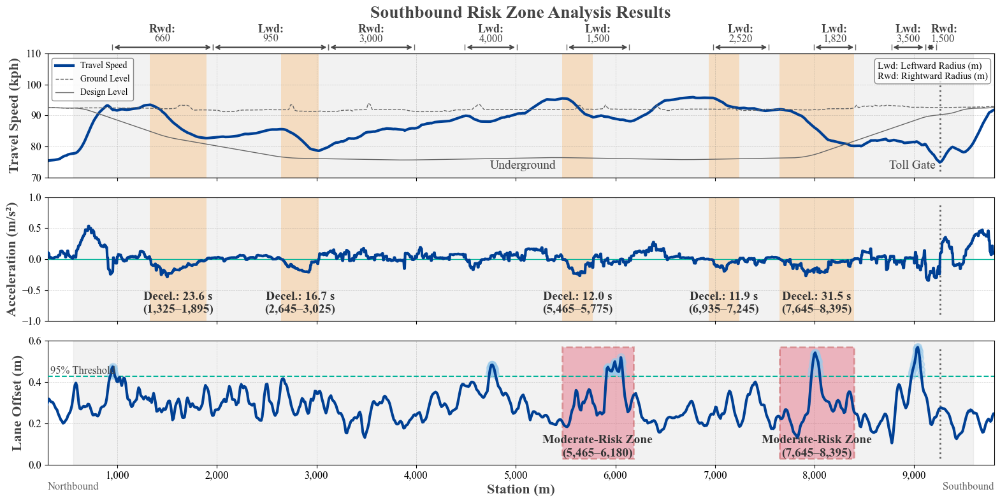

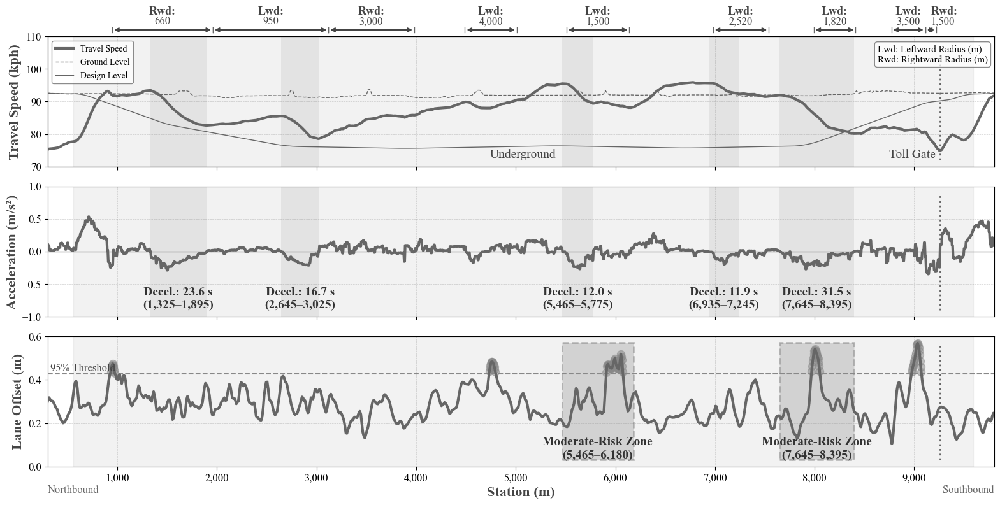

  - Southbound의 위험 구간 검토를 완료하였습니다. (2024-08-03 19:50:14)


In [ ]:
# 03-2. Southbound 위험 구간 검토 (240803)
print("03-2. Southbound 위험 구간 검토")

# 감속 구간 및 도로편측 상위 95% 구간 계산 및 표시
def calculate_and_display_zones(df, png_file_name='sb_result_bw.png', graph_color='#666', hline_color='#888', marker_color='#888', decel_color='#aaa', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444', include_title=False):
    # 감속 구간 계산
    deceleration_threshold = 0  # 감속 임계값 (m/s²)
    df['deceleration'] = df['acceleration_ms2'].apply(lambda x: x if x < deceleration_threshold else 0)

    # 시간 계산
    df['time_diff_sec'] = df['cumulative_time_min'].diff().fillna(0) * 60  # 초 단위 시간 차이
    df['deceleration_duration_sec'] = df['time_diff_sec'] * (df['deceleration'] != 0).astype(int)
    df['deceleration_duration_sec_cumsum'] = df.groupby((df['deceleration_duration_sec'] == 0).cumsum())['deceleration_duration_sec'].cumsum()

    long_deceleration_zones = df[df['deceleration_duration_sec_cumsum'] >= 10]  # 감속이 10초 이상 이어지는 구간

    # 도로편측 상위 95% 구간 계산
    lane_offset_threshold = df['lane_offset_m'].quantile(0.95)
    high_lane_offset_zones = df[df['lane_offset_m'] > lane_offset_threshold]  # 도로편측 상위 95% 구간

    # 감속 구간 시작 및 끝 표시
    deceleration_segments = []
    for key, group in df.groupby((df['deceleration_duration_sec_cumsum'] == 0).cumsum()):
        if len(group) > 1 and group['deceleration_duration_sec_cumsum'].max() >= 10:
            start = group['station'].iloc[0]
            end = group['station'].iloc[-1]
            duration = group['deceleration_duration_sec_cumsum'].max()
            deceleration_segments.append((start, end, duration))

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_ms2'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_legend = 51  # 범례
    z_graph = 61  # 그래프
    z_text = 71  # 텍스트

    # ==========
    # Travel Speed 시각화
    if include_title:
        axes[0].set_title('Southbound Risk Zone Analysis Results', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['station'], df['travel_speed_kph'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(300, 9800)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['station'], df['ground_level_m'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['station'], df['design_level_m'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level_m'].min()-30, df['ground_level_m'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    legend = axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)
    legend.set_zorder(z_legend)
    legend.get_frame().set_facecolor('#fff')
    legend.get_frame().set_edgecolor('#666')
    legend.get_frame().set_alpha(0.75)  # 투명도 설정 (0=투명, 1=불투명)

    # 터널 구간(X=560~9590)에 사각형 및 레이블 추가
    rect = plt.Rectangle((560, axes[0].get_ylim()[0]), 9030, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text(560+(9590-560)/2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    axes[0].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(9260-50, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='right', zorder=z_text)

    # X축 구간을 화살표로 표시
    segments = [(950, 1960), (1960, 3120), (3120, 3980), (4490, 5010), (5510, 6140), (6980, 7540), (7990, 8410), (8770, 9110), (9110, 9220)]
    messages = [
        ("Rwd:", "660", 'center'), ("Lwd:", "950", 'center'), ("Rwd:", "3,000", 'center'), ("Lwd:", "4,000", 'center'),
        ("Lwd:", "1,500", 'center'), ("Lwd:", "2,520", 'center'), ("Lwd:", "1,820", 'center'), ("Lwd:", "3,500", 'center'),
        ("Rwd:", "1,500", 'left')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        axes[0].annotate('', xy=(end, 1.05), xytext=(start, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start, start], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end, end], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start + end) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', edgecolor='#666', alpha=0.75)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font, zorder=z_legend)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['station'], df['acceleration_ms2'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(300, 9800)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((560, axes[1].get_ylim()[0]), 9030, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['station'], df['lane_offset_m'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Station (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(300, 9800)  # X축 범위 설정
    axes[2].set_ylim(0, 0.6)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[2].xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))  # X축 눈금 표시방법 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((560, axes[2].get_ylim()[0]), 9030, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=5465~6180)에 사각형 추가
    rect = plt.Rectangle((5465, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 715, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((5465+6180)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(5,465–6,180)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=7645~8395)에 사각형 추가
    rect = plt.Rectangle((7645, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 750, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((7645+8395)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(7,645–8,395)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile = df['lane_offset_m'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].scatter(high_lane_offset_zones['station'], high_lane_offset_zones['lane_offset_m'], color=marker_color, label='High Lane Offset Zone', marker='o', s=75, alpha=0.5, zorder=z_marker)
    axes[2].text(300+30, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # 감속 구간 음영 표시
    for start, end, duration in deceleration_segments:
        for ax in axes[:-1]:  # 마지막 그래프 제외
            rect = plt.Rectangle((start, ax.get_ylim()[0]), end - start, ax.get_ylim()[1] - ax.get_ylim()[0], color=decel_color, alpha=0.2, linewidth=0)
            ax.add_patch(rect)
        axes[1].text((start + end) / 2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05, f'Decel.: {duration:.1f} s\n({int(start):,}–{int(end):,})', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Southbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
calculate_and_display_zones(
    southbound_df,
    png_file_name='sb_result_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    marker_color=UOS_Blue_Soft,
    decel_color='#ff8800',
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000',
    include_title=True
)
# 흑백 그래프
calculate_and_display_zones(southbound_df)

print(f"  - Southbound의 위험 구간 검토를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

03-3. Southbound 데이터 시각화 (주행시간 기준)


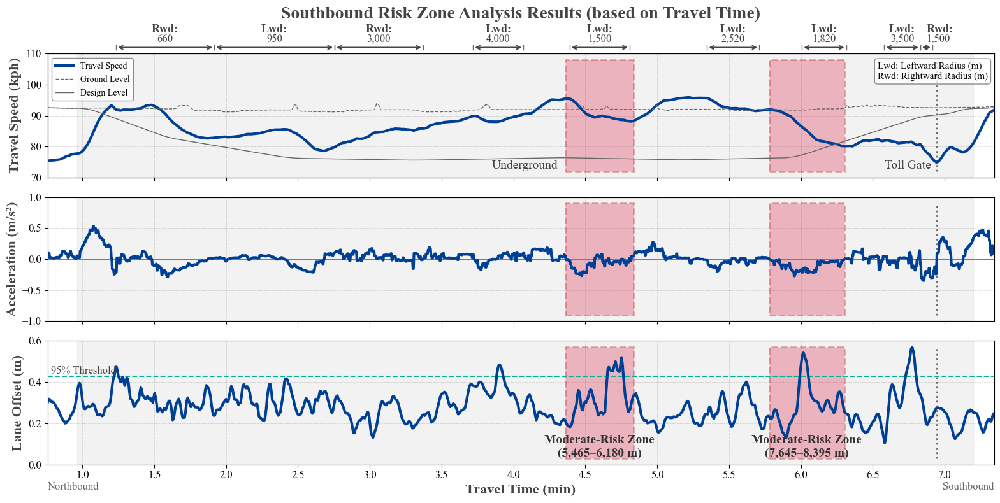

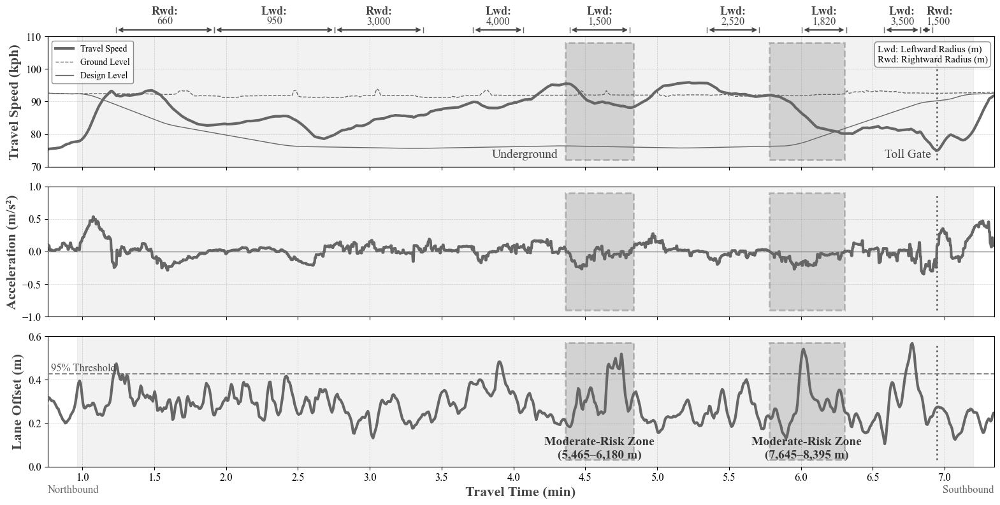

  - Southbound 데이터 시각화를 완료하였습니다. (2024-08-03 19:50:20)


In [ ]:
# 03-3. Southbound 데이터 시각화 (주행시간 기준) (240803)
print("03-3. Southbound 데이터 시각화 (주행시간 기준)")

# Southbound 데이터 시각화 함수 정의
def visualize_data(df, png_file_name='sb_result_travel_time_bw.png', graph_color='#666', hline_color='#888', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444', include_title=False):
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_ms2'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_legend = 51  # 범례
    z_graph = 61  # 그래프
    z_text = 71  # 텍스트

    # ==========
    # Travel Speed 시각화
    start_graph_time = df[df['station'] == 300]['cumulative_time_min'].values[0]
    end_graph_time = df[df['station'] == 9800]['cumulative_time_min'].values[0]
    if include_title:
        axes[0].set_title('Southbound Risk Zone Analysis Results (based on Travel Time)', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['cumulative_time_min'], df['travel_speed_kph'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['cumulative_time_min'], df['ground_level_m'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['cumulative_time_min'], df['design_level_m'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level_m'].min()-30, df['ground_level_m'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    legend = axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)
    legend.set_zorder(z_legend)
    legend.get_frame().set_facecolor('#fff')
    legend.get_frame().set_edgecolor('#666')
    legend.get_frame().set_alpha(0.75)  # 투명도 설정 (0=투명, 1=불투명)

    # 터널 구간(X=560~9590)에 사각형 및 레이블 추가
    start_tunnel_time = df[df['station'] == 560]['cumulative_time_min'].values[0]
    end_tunnel_time = df[df['station'] == 9590]['cumulative_time_min'].values[0]
    rect = plt.Rectangle((start_tunnel_time, axes[0].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text((start_tunnel_time + end_tunnel_time) / 2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    toll_gate_time = df[df['station'] == 9260]['cumulative_time_min'].values[0]
    toll_gate_label_time = df[df['station'] == (9260-50)]['cumulative_time_min'].values[0]
    axes[0].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(toll_gate_label_time, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='right', zorder=z_text)

    # 위험 구간(X=5465~6180)에 사각형 추가
    start_risk_zone_time_1 = df[df['station'] == 5465]['cumulative_time_min'].values[0]
    end_risk_zone_time_1 = df[df['station'] == 6180]['cumulative_time_min'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_1, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # 위험 구간(X=7645~8395)에 사각형 추가
    start_risk_zone_time_2 = df[df['station'] == 7645]['cumulative_time_min'].values[0]
    end_risk_zone_time_2 = df[df['station'] == 8395]['cumulative_time_min'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # X축 구간을 화살표로 표시
    segments = [(950, 1960), (1960, 3120), (3120, 3980), (4490, 5010), (5510, 6140), (6980, 7540), (7990, 8410), (8770, 9110), (9110, 9220)]
    messages = [
        ("Rwd:", "660", 'center'), ("Lwd:", "950", 'center'), ("Rwd:", "3,000", 'center'), ("Lwd:", "4,000", 'center'),
        ("Lwd:", "1,500", 'center'), ("Lwd:", "2,520", 'center'), ("Lwd:", "1,820", 'center'), ("Lwd:", "3,500", 'center'),
        ("Rwd:", "1,500", 'left')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        start_time = df[df['station'] == start]['cumulative_time_min'].values[0]
        end_time = df[df['station'] == end]['cumulative_time_min'].values[0]
        axes[0].annotate('', xy=(end_time, 1.05), xytext=(start_time, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start_time, start_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end_time, end_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start_time + end_time) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', edgecolor='#666', alpha=0.75)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font, zorder=z_legend)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['cumulative_time_min'], df['acceleration_ms2'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[1].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # 위험 구간(X=5465~6180)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)
    # 위험 구간(X=7645~8395)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['cumulative_time_min'], df['lane_offset_m'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Travel Time (min)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[2].set_ylim(0, 0.6)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=560~9590)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[2].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=5465~6180)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_1 + end_risk_zone_time_1) / 2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(5,465–6,180 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=7645~8395)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_2 + end_risk_zone_time_2) / 2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05, 'Moderate-Risk Zone\n(7,645–8,395 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile_text = df[df['station'] == (300+30)]['cumulative_time_min'].values[0]
    lane_offset_95_percentile = df['lane_offset_m'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].text(lane_offset_95_percentile_text, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Southbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
visualize_data(
    southbound_df,
    png_file_name='sb_result_travel_time_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000',
    include_title=True
)
# 흑백 그래프
visualize_data(southbound_df)

print(f"  - Southbound 데이터 시각화를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

## 03-3. 성산 방면

03-4. Northbound 위험 구간 검토


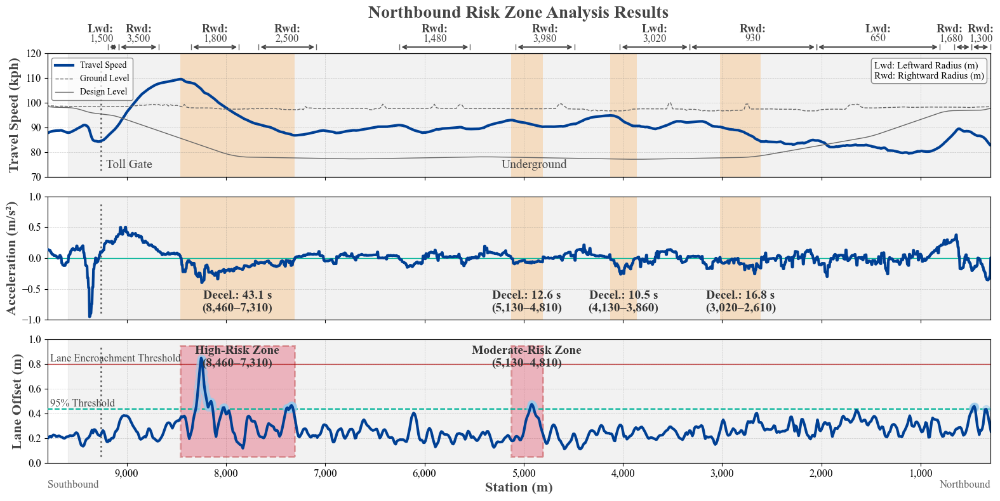

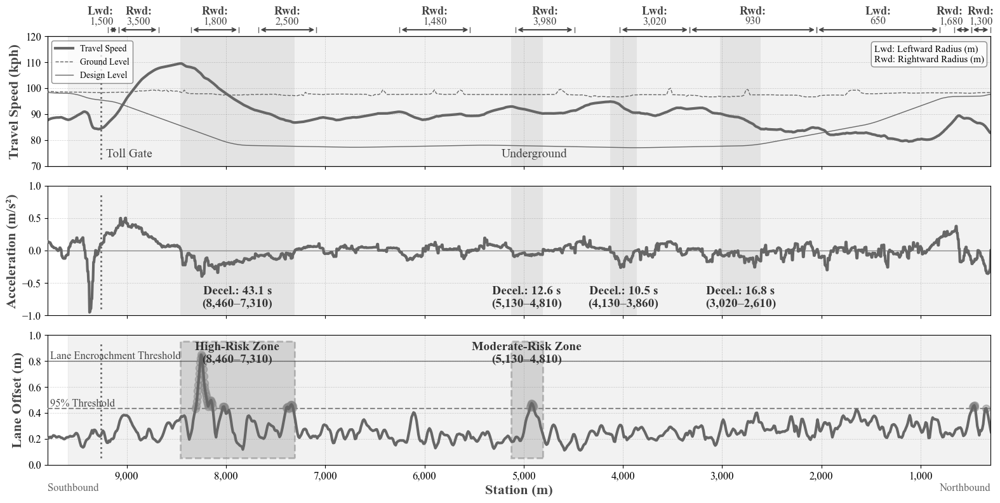

  - Northbound의 위험 구간 검토를 완료하였습니다. (2024-08-03 19:50:28)


In [ ]:
# 03-4. Northbound 위험 구간 검토 (240803)
print("03-4. Northbound 위험 구간 검토")

# 감속 구간 및 도로편측 상위 95% 구간 계산 및 표시
def calculate_and_display_zones(df, png_file_name='nb_result_bw.png', graph_color='#666', hline_color='#888', marker_color='#888', decel_color='#aaa', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444', include_title=False):
    # 감속 구간 계산
    deceleration_threshold = 0  # 감속 임계값 (m/s²)
    df['deceleration'] = df['acceleration_ms2'].apply(lambda x: x if x < deceleration_threshold else 0)

    # 시간 계산
    df['time_diff_sec'] = df['cumulative_time_min'].diff().fillna(0) * 60  # 초 단위 시간 차이
    df['deceleration_duration_sec'] = df['time_diff_sec'] * (df['deceleration'] != 0).astype(int)
    df['deceleration_duration_sec_cumsum'] = df.groupby((df['deceleration_duration_sec'] == 0).cumsum())['deceleration_duration_sec'].cumsum()

    long_deceleration_zones = df[df['deceleration_duration_sec_cumsum'] >= 10]  # 감속이 10초 이상 이어지는 구간

    # 도로편측 상위 95% 구간 계산
    lane_offset_threshold = df['lane_offset_m'].quantile(0.95)
    high_lane_offset_zones = df[df['lane_offset_m'] > lane_offset_threshold]  # 도로편측 상위 95% 구간

    # 감속 구간 시작 및 끝 표시
    deceleration_segments = []
    for key, group in df.groupby((df['deceleration_duration_sec_cumsum'] == 0).cumsum()):
        if len(group) > 1 and group['deceleration_duration_sec_cumsum'].max() >= 10:
            start = group['station'].iloc[0]
            end = group['station'].iloc[-1]
            duration = group['deceleration_duration_sec_cumsum'].max()
            deceleration_segments.append((start, end, duration))

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_ms2'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_legend = 51  # 범례
    z_graph = 61  # 그래프
    z_text = 71  # 텍스트

    # ==========
    # Travel Speed 시각화
    if include_title:
    	axes[0].set_title('Northbound Risk Zone Analysis Results', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['station'], df['travel_speed_kph'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(9800, 300)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['station'], df['ground_level_m'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['station'], df['design_level_m'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level_m'].min()-30, df['ground_level_m'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    legend = axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)
    legend.set_zorder(z_legend)
    legend.get_frame().set_facecolor('#fff')
    legend.get_frame().set_edgecolor('#666')
    legend.get_frame().set_alpha(0.75)  # 투명도 설정 (0=투명, 1=불투명)

    # 터널 구간(X=9590~190)에 사각형 및 레이블 추가
    rect = plt.Rectangle((190, axes[0].get_ylim()[0]), 9400, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text(190+(9590-190)/2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    axes[0].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(9260-50, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # X축 구간을 화살표로 표시
    segments = [(300, 490), (490, 660), (810, 2050), (2050, 3330), (3330, 4030), (4490, 5080), (5540, 6250), (7090, 7670), (7870, 8350), (8680, 9080), (9080, 9190)]
    messages = [
        ("Rwd:", "1,300", 'center'), ("Rwd:", "1,680", 'right'), ("Lwd:", "650", 'center'), ("Rwd:", "930", 'center'),
        ("Lwd:", "3,020", 'center'), ("Rwd:", "3,980", 'center'), ("Rwd:", "1,480", 'center'), ("Rwd:", "2,500", 'center'),
        ("Rwd:", "1,800", 'center'), ("Rwd:", "3,500", 'center'), ("Lwd:", "1,500", 'right')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        axes[0].annotate('', xy=(end, 1.05), xytext=(start, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start, start], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end, end], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start + end) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', edgecolor='#666', alpha=0.75)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font, zorder=z_legend)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['station'], df['acceleration_ms2'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(9800, 300)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((190, axes[1].get_ylim()[0]), 9400, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['station'], df['lane_offset_m'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Station (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(9800, 300)  # X축 범위 설정
    axes[2].set_ylim(0, 1)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(1000))  # X축 눈금 간격 설정
    axes[2].xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))  # X축 눈금 표시방법 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((190, axes[2].get_ylim()[0]), 9400, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=9260, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=8460~7310)에 사각형 추가
    rect = plt.Rectangle((7310, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 1150, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((8460+7310)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'High-Risk Zone\n(8,460–7,310)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=5130~4810)에 사각형 추가
    rect = plt.Rectangle((4810, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), 320, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((5130+4810)/2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'Moderate-Risk Zone\n(5,130–4,810)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile = df['lane_offset_m'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].scatter(high_lane_offset_zones['station'], high_lane_offset_zones['lane_offset_m'], color=marker_color, label='High Lane Offset Zone', marker='o', s=75, alpha=0.5, zorder=z_marker)
    axes[2].text(9800-30, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Y=0.8 위치에 가로선 추가
    axes[2].axhline(y=0.8, color=le_threshold_color, linestyle='-', linewidth=1, alpha=0.75, zorder=z_hline)
    axes[2].text(9800-30, 0.8, 'Lane Encroachment Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # 감속 구간 음영 표시
    for start, end, duration in deceleration_segments:
        for ax in axes[:-1]:  # 마지막 그래프 제외
            rect = plt.Rectangle((start, ax.get_ylim()[0]), end - start, ax.get_ylim()[1] - ax.get_ylim()[0], color=decel_color, alpha=0.2, linewidth=0)
            ax.add_patch(rect)
        axes[1].text((start + end) / 2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05, f'Decel.: {duration:.1f} s\n({int(start):,}–{int(end):,})', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Northbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
calculate_and_display_zones(
    northbound_df,
    png_file_name='nb_result_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    marker_color=UOS_Blue_Soft,
    decel_color='#ff8800',
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000',
    include_title=True
)
# 흑백 그래프
calculate_and_display_zones(northbound_df)

print(f"  - Northbound의 위험 구간 검토를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================

03-5. Northbound 데이터 시각화 (주행시간 기준)


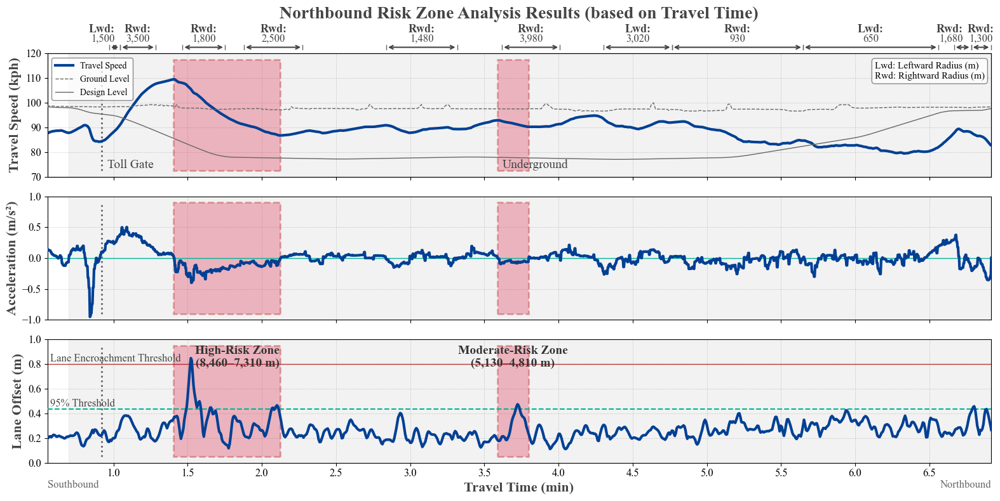

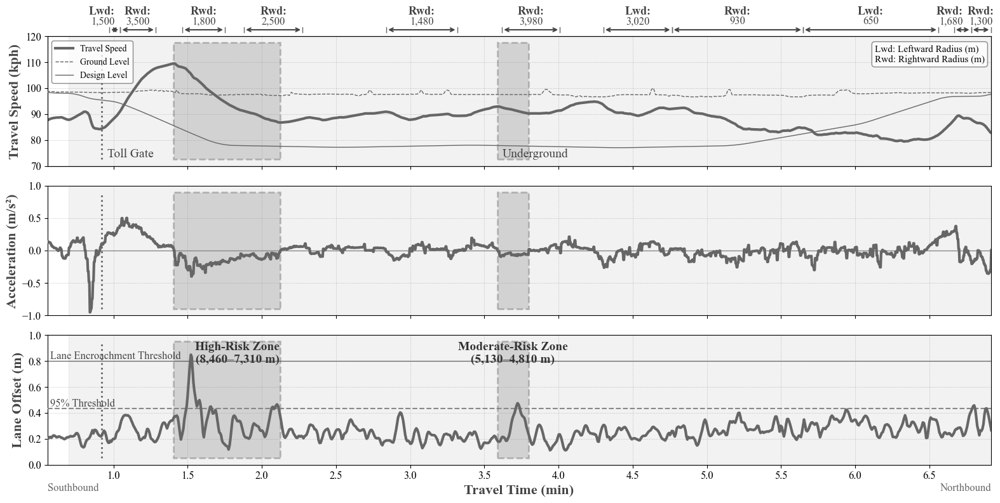

  - Northbound 데이터 시각화를 완료하였습니다. (2024-08-03 19:50:34)


In [ ]:
# 03-5. Northbound 데이터 시각화 (주행시간 기준) (240803)
print("03-5. Northbound 데이터 시각화 (주행시간 기준)")

# Northbound 데이터 시각화 함수 정의
def visualize_data(df, png_file_name='nb_result_travel_time_bw.png', graph_color='#666', hline_color='#888', risk_zone_color='#888', rz_line_color='#444', le_threshold_color='#444', include_title=False):
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 8))

    # Y축 범위 계산
    max_speed = math.ceil(df['travel_speed_kph'].max() / 10) * 10 + 10  # 주행속도 최대값
    max_acceleration = 1  # 가속도 최대값
    min_acceleration = math.floor(df['acceleration_ms2'].min())  # 가속도 최소값

    # zorder
    z_underground_box = 1  # 언더그라운드 박스
    z_ground_level = 11  # 지반고
    z_design_level = 12  # 계획고
    z_decel_box = 16  # 감속 구간 박스
    z_risk_box = 17  # 위험 구간 박스
    z_toll_gate_vline = 21  # 톨게이트 세로선
    z_hline = 31  # 가로선
    z_marker = 41  # 마커
    z_legend = 51  # 범례
    z_graph = 61  # 그래프
    z_text = 71  # 텍스트

    # ==========
    # Travel Speed 시각화
    start_graph_time = df[df['station'] == 9800]['cumulative_time_min'].values[0]
    end_graph_time = df[df['station'] == 300]['cumulative_time_min'].values[0]
    if include_title:
        axes[0].set_title('Northbound Risk Zone Analysis Results (based on Travel Time)', fontproperties=times_bold_font, fontsize=20, color='#444', pad=40)  # 타이틀
    axes[0].plot(df['cumulative_time_min'], df['travel_speed_kph'], label='Travel Speed', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[0].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[0].set_ylabel('Travel Speed (kph)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[0].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[0].set_ylim(70, max_speed)  # Y축 범위 설정
    axes[0].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[0].yaxis.set_major_locator(ticker.MultipleLocator(10))  # Y축 눈금 간격 설정
    axes[0].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[0].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # Ground Level 및 Design Level 시각화
    axes2 = axes[0].twinx()  # 두 번째 Y축 생성
    axes2.plot(df['cumulative_time_min'], df['ground_level_m'], label='Ground Level', color='#666', linestyle='--', linewidth=1, zorder=z_ground_level)  # 지반고
    axes2.plot(df['cumulative_time_min'], df['design_level_m'], label='Design Level', color='#666', linestyle='-', linewidth=1, zorder=z_design_level)  # 계획고
    axes2.set_ylim(df['design_level_m'].min()-30, df['ground_level_m'].max()+80)  # Y축 범위 설정
    axes2.set_yticks([])  # Y축 눈금 제거
    axes2.set_ylabel('')  # Y축 레이블 제거

    # 범례 설정
    lines_1, labels_1 = axes[0].get_legend_handles_labels()
    lines_2, labels_2 = axes2.get_legend_handles_labels()
    legend = axes[0].legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize=12, prop=times_font)
    legend.set_zorder(z_legend)
    legend.get_frame().set_facecolor('#fff')
    legend.get_frame().set_edgecolor('#666')
    legend.get_frame().set_alpha(0.75)  # 투명도 설정 (0=투명, 1=불투명)

    # 터널 구간(X=9590~190)에 사각형 및 레이블 추가
    start_tunnel_time = df[df['station'] == 190]['cumulative_time_min'].values[0]
    end_tunnel_time = df[df['station'] == 9590]['cumulative_time_min'].values[0]
    rect = plt.Rectangle((start_tunnel_time, axes[0].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[0].add_patch(rect)
    axes[0].text((start_tunnel_time + end_tunnel_time) / 2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Underground', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='center', zorder=z_text)

    # Toll Gate 위치에 세로선 및 레이블 추가
    toll_gate_time = df[df['station'] == 9260]['cumulative_time_min'].values[0]
    toll_gate_label_time = df[df['station'] == (9260-50)]['cumulative_time_min'].values[0]
    axes[0].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)
    axes[0].text(toll_gate_label_time, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05, 'Toll Gate', color='#444', fontsize=14, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # 위험 구간(X=8460~7310)에 사각형 추가
    start_risk_zone_time_1 = df[df['station'] == 7310]['cumulative_time_min'].values[0]
    end_risk_zone_time_1 = df[df['station'] == 8460]['cumulative_time_min'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_1, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # 위험 구간(X=5130~4810)에 사각형 추가
    start_risk_zone_time_2 = df[df['station'] == 5130]['cumulative_time_min'].values[0]
    end_risk_zone_time_2 = df[df['station'] == 4810]['cumulative_time_min'].values[0]
    rect = plt.Rectangle((start_risk_zone_time_2, axes[0].get_ylim()[0] + (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[0].get_ylim()[1] - axes[0].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[0].add_patch(rect)

    # X축 구간을 화살표로 표시
    segments = [(300, 490), (490, 660), (810, 2050), (2050, 3330), (3330, 4030), (4490, 5080), (5540, 6250), (7090, 7670), (7870, 8350), (8680, 9080), (9080, 9190)]
    messages = [
        ("Rwd:", "1,300", 'center'), ("Rwd:", "1,680", 'right'), ("Lwd:", "650", 'center'), ("Rwd:", "930", 'center'),
        ("Lwd:", "3,020", 'center'), ("Rwd:", "3,980", 'center'), ("Rwd:", "1,480", 'center'), ("Rwd:", "2,500", 'center'),
        ("Rwd:", "1,800", 'center'), ("Rwd:", "3,500", 'center'), ("Lwd:", "1,500", 'right')
    ]
    for (start, end), (first_line, second_line, align) in zip(segments, messages):
        start_time = df[df['station'] == start]['cumulative_time_min'].values[0]
        end_time = df[df['station'] == end]['cumulative_time_min'].values[0]
        axes[0].annotate('', xy=(end_time, 1.05), xytext=(start_time, 1.05),
                         xycoords=('data', 'axes fraction'), textcoords=('data', 'axes fraction'),
                         arrowprops=dict(arrowstyle='<->', color='#444', lw=1.5, clip_on=False))
        axes[0].plot([start_time, start_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)
        axes[0].plot([end_time, end_time], [1.03, 1.07], transform=axes[0].get_xaxis_transform(), color='#666', lw=1.0, clip_on=False)

        # 각 화살표 위에 첫 줄과 둘째 줄 메시지를 정렬하여 입력
        mid_point = (start_time + end_time) / 2
        axes[0].text(mid_point, 1.15, first_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=13, fontproperties=times_bold_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)
        axes[0].text(mid_point, 1.075, second_line, transform=axes[0].get_xaxis_transform(), color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment=align, clip_on=False)

    # 구간 설명 박스 추가
    props = dict(boxstyle='round', facecolor='#fff', edgecolor='#666', alpha=0.75)
    textstr = 'Lwd: Leftward Radius (m)\nRwd: Rightward Radius (m)'
    axes[0].text(0.877, 0.936, textstr, transform=axes[0].transAxes, fontsize=11,
                 verticalalignment='top', bbox=props, fontproperties=times_font, zorder=z_legend)

    # ==========
    # Acceleration 시각화
    axes[1].plot(df['cumulative_time_min'], df['acceleration_ms2'], label='Average Acceleration (m/s²)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[1].tick_params(labelbottom=False)  # X축 레이블 (제거)
    axes[1].set_ylabel('Acceleration (m/s²)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[1].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[1].set_ylim(min_acceleration, max_acceleration)  # Y축 범위 설정
    axes[1].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[1].yaxis.set_major_locator(ticker.MultipleLocator(0.5))  # Y축 눈금 간격 설정
    axes[1].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[1].get_yticklabels():  # Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[1].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[1].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[1].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # Y=0 위치에 가로선 추가
    axes[1].axhline(y=0, color=hline_color, linestyle='-', linewidth=1, alpha=1.0, zorder=z_hline)

    # 위험 구간(X=8460~7310)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)
    # 위험 구간(X=5130~4810)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[1].get_ylim()[0] + (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[1].get_ylim()[1] - axes[1].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[1].add_patch(rect)

    # ==========
    # Lane Offset 시각화
    axes[2].plot(df['cumulative_time_min'], df['lane_offset_m'], label='Average Lane Offset (m)', color=graph_color, linewidth=3, zorder=z_graph)  # 그래프
    axes[2].set_xlabel('Travel Time (min)', fontproperties=times_bold_font, fontsize=16, color='#444')  # X축 레이블
    axes[2].set_ylabel('Lane Offset (m)', fontproperties=times_bold_font, fontsize=16, color='#444')  # Y축 레이블
    axes[2].set_xlim(start_graph_time, end_graph_time)  # X축 범위 설정
    axes[2].set_ylim(0, 1)  # Y축 범위 설정
    axes[2].xaxis.set_major_locator(ticker.MultipleLocator(0.5))  # X축 눈금 간격 설정
    axes[2].yaxis.set_major_locator(ticker.MultipleLocator(0.2))  # Y축 눈금 간격 설정
    axes[2].grid(True, which='both', axis='both', color='#666', linestyle='--', linewidth=0.5, alpha=0.3)  # 그리드 설정
    for label in axes[2].get_xticklabels() + axes[2].get_yticklabels():  # X축 및 Y축 눈금(틱) 레이블 설정
        label.set_fontproperties(times_font)
        label.set_fontsize(12)

    # 터널 구간(X=9590~190)에 사각형 추가
    rect = plt.Rectangle((start_tunnel_time, axes[2].get_ylim()[0]), end_tunnel_time - start_tunnel_time, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 1.0, color='#aaa', alpha=0.15, zorder=z_underground_box)
    axes[2].add_patch(rect)

    # Toll Gate 위치에 세로선 추가
    axes[2].axvline(x=toll_gate_time, color='#666', linestyle=':', linewidth=2, ymin=0.05, ymax=0.95, zorder=z_toll_gate_vline)

    # 위험 구간(X=8460~7310)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_1, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_1 - start_risk_zone_time_1, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_1 + end_risk_zone_time_1) * 2.6 / 5, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'High-Risk Zone\n(8,460–7,310 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)
    # 위험 구간(X=5130~4810)에 사각형 추가
    rect = plt.Rectangle((start_risk_zone_time_2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.05), end_risk_zone_time_2 - start_risk_zone_time_2, (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.9, color=risk_zone_color, alpha=0.3, ec=rz_line_color, linestyle='--', linewidth=2, zorder=z_risk_box)
    axes[2].add_patch(rect)
    axes[2].text((start_risk_zone_time_2 + end_risk_zone_time_2) / 2, axes[2].get_ylim()[0] + (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.95, 'Moderate-Risk Zone\n(5,130–4,810 m)', color='#333', fontsize=14, fontproperties=times_bold_font, verticalalignment='top', horizontalalignment='center', zorder=z_text)

    # 상위 95% 지점에 가로선 추가
    lane_offset_95_percentile_text = df[df['station'] == (9800-30)]['cumulative_time_min'].values[0]
    lane_offset_95_percentile = df['lane_offset_m'].quantile(0.95)
    axes[2].axhline(y=lane_offset_95_percentile, color=hline_color, linestyle='--', linewidth=1.5, label='95% Lane Offset Threshold', zorder=z_hline)
    axes[2].text(lane_offset_95_percentile_text, lane_offset_95_percentile, '95% Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Y=0.8 위치에 가로선 추가
    axes[2].axhline(y=0.8, color=le_threshold_color, linestyle='-', linewidth=1, alpha=0.75, zorder=z_hline)
    axes[2].text(lane_offset_95_percentile_text, 0.8, 'Lane Encroachment Threshold', color='#444', fontsize=12, fontproperties=times_font, verticalalignment='bottom', horizontalalignment='left', zorder=z_text)

    # Southbound와 Northbound 텍스트 추가
    x_min, x_max = axes[2].get_xlim()  # X축의 최소값과 최대값 가져오기
    axes[2].text(x_max, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Northbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='right')
    axes[2].text(x_min, axes[2].get_ylim()[0] - (axes[2].get_ylim()[1] - axes[2].get_ylim()[0]) * 0.14, 'Southbound', color='#666', fontsize=12, fontproperties=times_font, verticalalignment='top', horizontalalignment='left')

    # 레이아웃 조정
    plt.tight_layout()
    plt.show()

    # 전체 그래프를 파일로 저장
    output_file_path = os.path.join(base_path, 'Output', png_file_name)
    fig.savefig(output_file_path, dpi=300, bbox_inches='tight')

# color
UOS_Signature_Blue = '#004094'
UOS_Blue_Soft = '#9bcbeb'
UOS_Emerald = '#00b398'

# Northbound 데이터를 이용한 위험 구간 검토
# 컬러 그래프
visualize_data(
    northbound_df,
    png_file_name='nb_result_travel_time_color.png',
    graph_color=UOS_Signature_Blue,
    hline_color=UOS_Emerald,
    risk_zone_color='#dd2244',
    rz_line_color='#aa0000',
    le_threshold_color='#aa0000',
    include_title=True
)
# 흑백 그래프
visualize_data(northbound_df)

print(f"  - Northbound 데이터 시각화를 완료하였습니다. ({datetime.now(tz).strftime('%Y-%m-%d %H:%M:%S')})")

# ==================================================